## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---


## 1. calibration using chessboard images

### - import modules

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.image as mpimg


In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
#         img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
#         cv2.imshow('img',img)
#         cv2.waitKey(500)

# cv2.destroyAllWindows()

### - Calibrate chessboard image

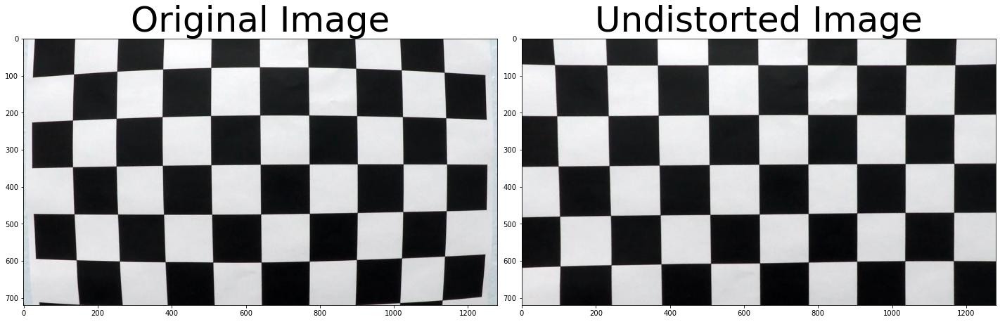

In [3]:
img = cv2.imread(images[0])
gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)
undistorted = cv2.undistort(img, mtx, dist, None, mtx)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
f.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.0)
f.savefig('output_chessboard_cal/calibrated1.jpg')
    
    

# 2. Pipeline using test images

### Step1 : Calibrate test image

In [4]:
images = glob.glob('test_images/*.jpg')

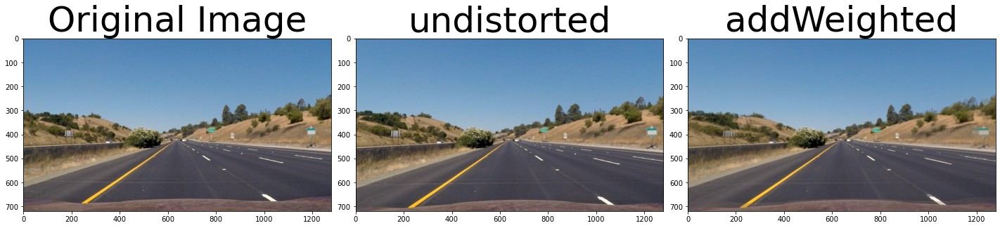

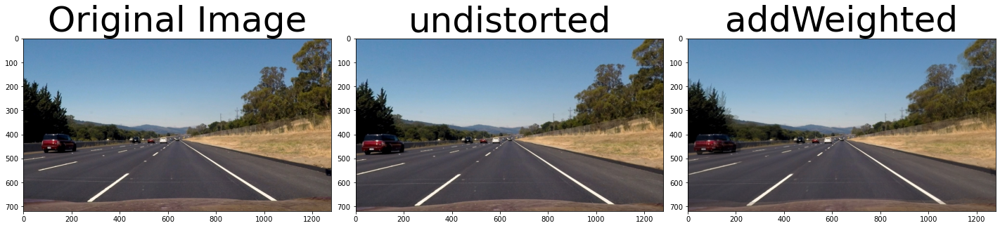

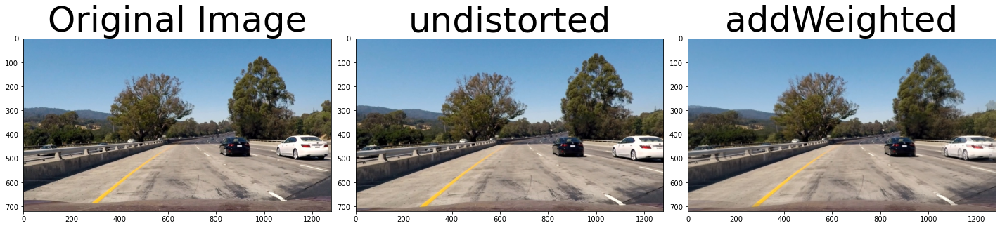

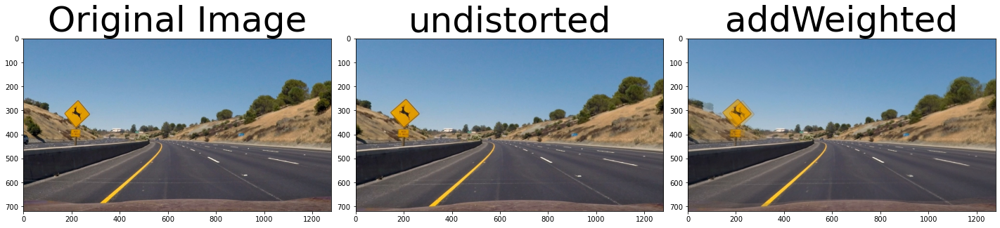

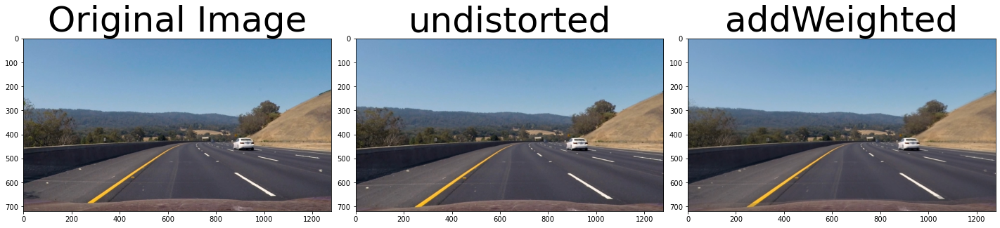

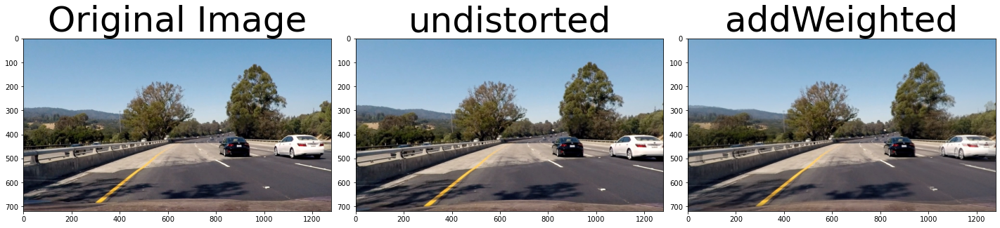

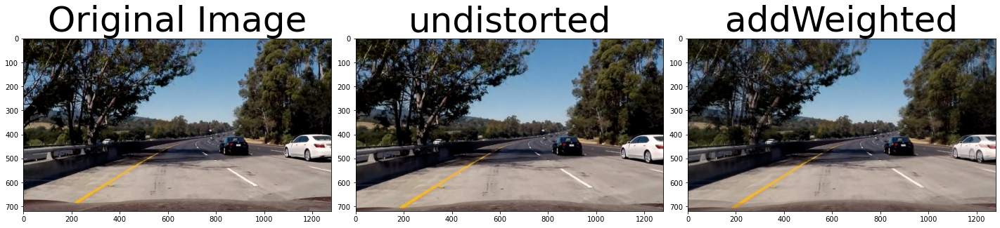

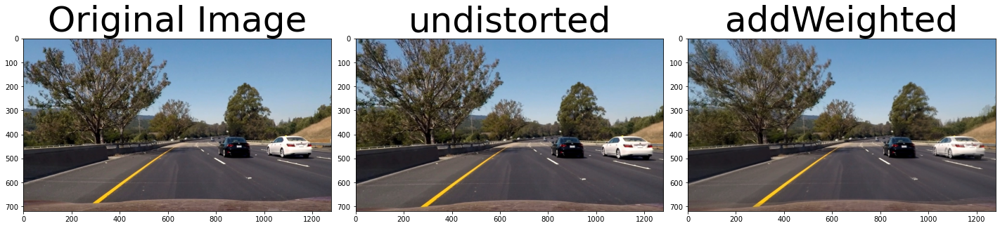

In [5]:
for fname in images:
    # slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]
    
    
    img = mpimg.imread(fname)
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    img_add = cv2.addWeighted(img, 0.3, undistorted, 0.7, 0)
    
    
    f, (ax1, ax2, ax3) = plt.subplots(nrows = 1, ncols = 3, figsize=(24, 9))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=50)
    ax2.imshow(undistorted)
    ax2.set_title('undistorted', fontsize=50)
    ax3.imshow(img_add)
    ax3.set_title('addWeighted', fontsize=50)
    f.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.0)
    f.savefig('output_step1/'+ img_name + '_step1_cal.jpg')
    

### Step2 : Binary test image

In [6]:
def abs_sobelx_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0)
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobelx = np.absolute(sobelx)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output  = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

def abs_sobely_thresh(img, orient='y', sobel_kernel=3, thresh=(0, 255)):

    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobely = cv2.Sobel(gray,cv2.CV_64F,0,1)
    
    # 3) Take the absolute value of the derivative or gradient
    abs_sobely = np.absolute(sobely)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobely/np.max(sobely))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output  = np.zeros_like(scaled_sobel)
    binary_output[(scaled_sobel >= thresh[0]) & (scaled_sobel <= thresh[1])] = 1

    return binary_output

def mag_thresh(img, sobel_kernel=9, mag_thresh=(0, 255)):
    
   # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobelx = cv2.Sobel(gray,cv2.CV_64F,1,0, ksize=sobel_kernel)
    sobely= cv2.Sobel(gray,cv2.CV_64F,0,1, ksize=sobel_kernel)
    
    # 3) Take the absolute value of the derivative or gradient
    gradmag = np.sqrt(sobelx**2 + sobely**2)
    
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    gradmag = np.uint8(255*gradmag/np.max(gradmag))
    
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    binary_output  = np.zeros_like(gradmag)
    binary_output[(gradmag >= mag_thresh[0]) & ( gradmag<= mag_thresh[1])] = 1
    
    return binary_output

def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    
    # Calculate the x and y gradients
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    
    # Take the absolute value of the gradient direction, 
    # apply a threshold, and create a binary image result
    absgraddir = np.arctan2(np.absolute(sobely), np.absolute(sobelx))
    binary_output =  np.zeros_like(absgraddir)
    binary_output[(absgraddir >= thresh[0]) & (absgraddir <= thresh[1])] = 1

    return binary_output

def gray_threshold(img, sobel_kernel=3, thresh=(20, 100)):
    # Grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    binary_output =  np.zeros_like(gray)
    binary_output[(gray >= thresh[0]) & (gray <= thresh[1]) ] = 1

    return binary_output


def hls_select(img, thresh=(0, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    s_channel = hls[:,:,2]
    
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(s_channel)
    binary_output[(s_channel > thresh[0]) & (s_channel <= thresh[1])] = 1
    
    # 3) Return a binary image of threshold result
    
    return binary_output




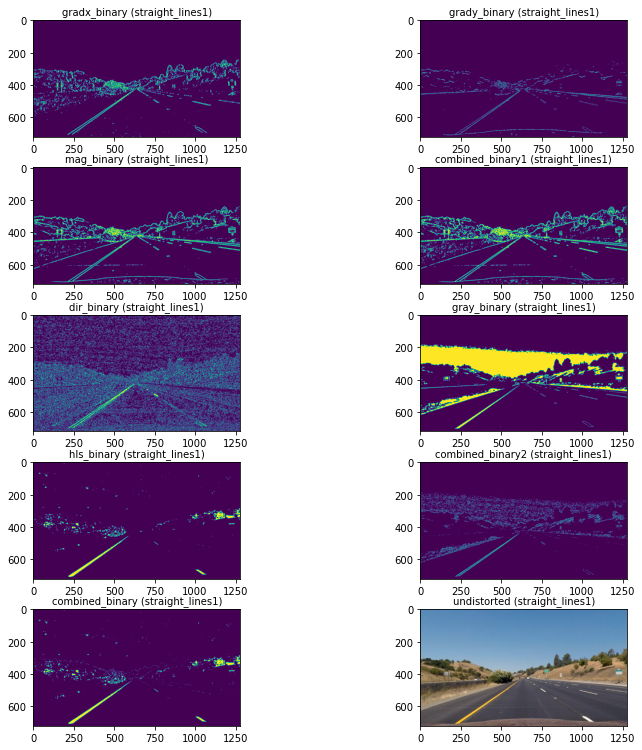

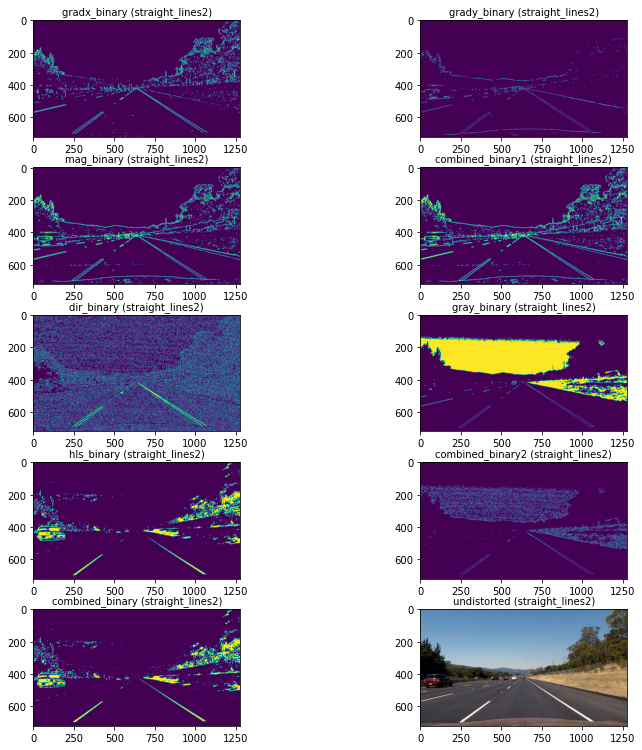

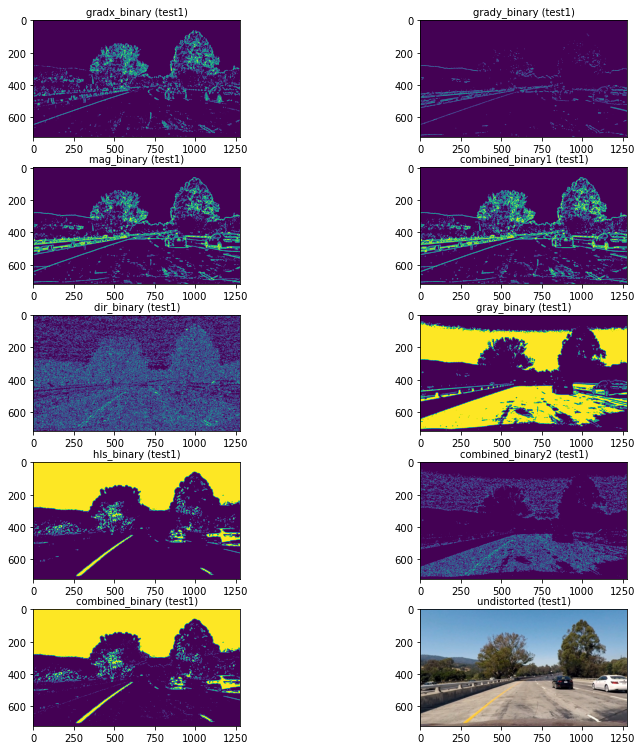

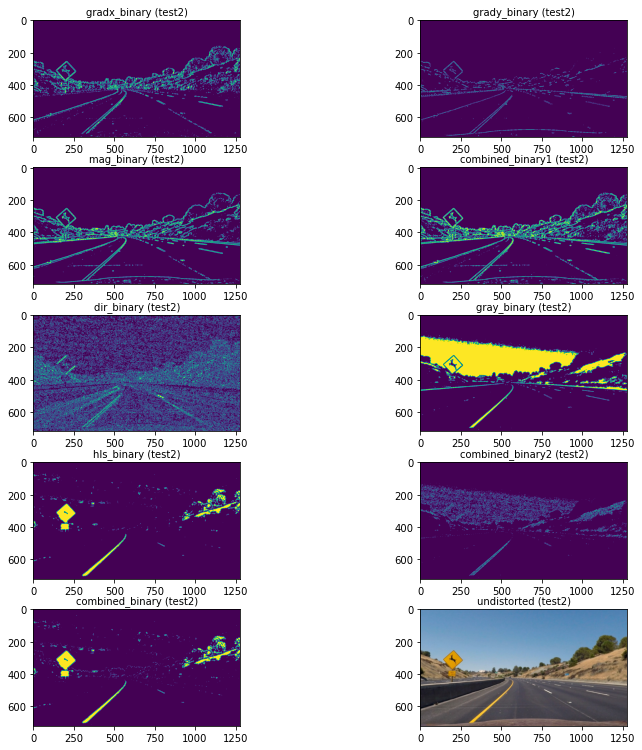

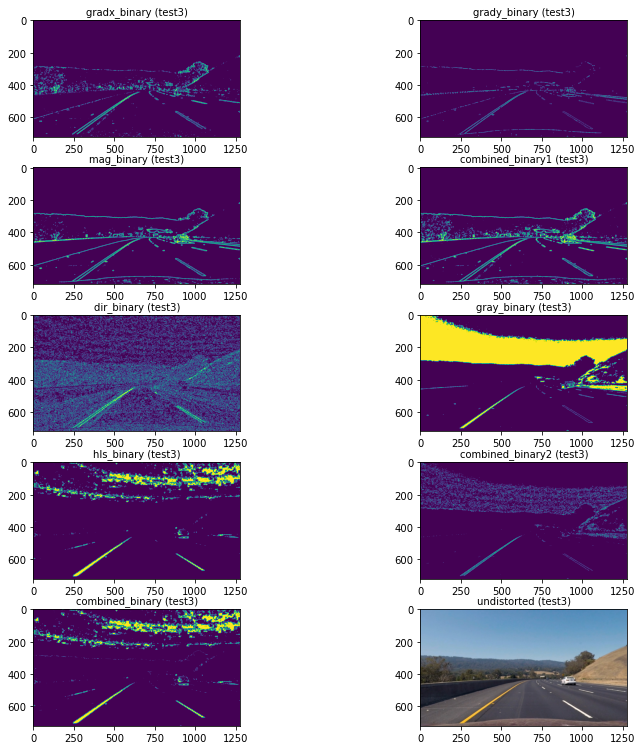

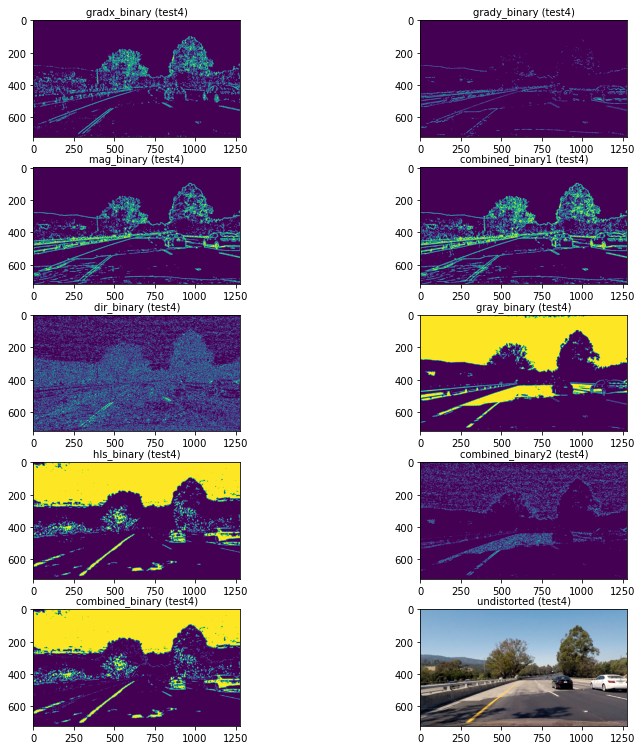

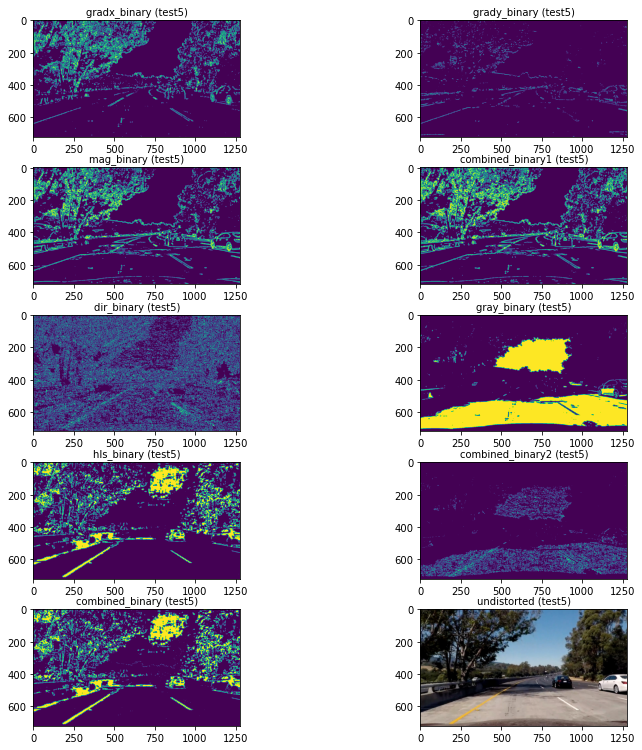

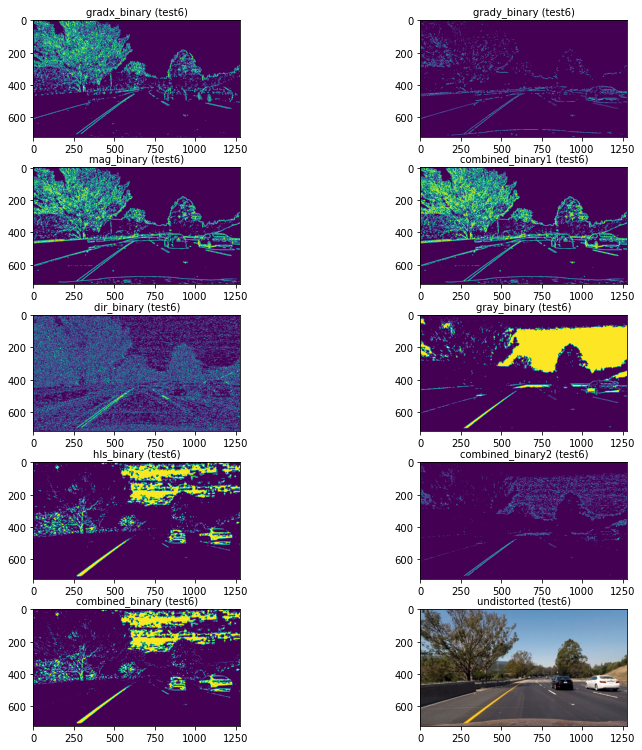

In [7]:
ksize = 3
for fname in images:
    # 0. slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]

    img = mpimg.imread(fname)
    
    # 1. calibration image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # 2. make binary image using grad or color tranform ...
    gradx_binary = abs_sobelx_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady_binary = abs_sobely_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(60, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(30, 180))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.8, 1.2))
    gray_binary = gray_threshold(undistorted, sobel_kernel=ksize, thresh=(150, 220))
    hls_binary = hls_select(undistorted, thresh=(110, 255))
    
    combined_binary1 = np.zeros_like(dir_binary)
    binary_condi1 = ((gradx_binary == 1) | (grady_binary== 1)) | (mag_binary == 1)
    combined_binary1[binary_condi1] = 1
    
    combined_binary2 = np.zeros_like(dir_binary)
    binary_condi2 = (gray_binary == 1) & (dir_binary == 1)
    combined_binary2[binary_condi2] = 1
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[binary_condi1 & binary_condi2 | (hls_binary == 1)] = 1
    
    

    

    
    f, ((ax1, ax2),(ax3, ax4),(ax5, ax6),(ax7, ax8),(ax9, ax10)) = plt.subplots(nrows = 5, ncols = 2, figsize=(15, 14))
    
    ax1.imshow(gradx_binary)
    ax1.set_title('gradx_binary '+'('+ img_name +')', fontsize=10)
    ax2.imshow(grady_binary)
    ax2.set_title('grady_binary '+'('+ img_name +')', fontsize=10)
    ax3.imshow(mag_binary)
    ax3.set_title('mag_binary '+'('+ img_name +')', fontsize=10)
    ax4.imshow(combined_binary1)
    ax4.set_title('combined_binary1 '+'('+ img_name +')', fontsize=10)
    ax5.imshow(dir_binary)
    ax5.set_title('dir_binary '+'('+ img_name +')', fontsize=10)
    ax6.imshow(gray_binary)
    ax6.set_title('gray_binary '+'('+ img_name +')', fontsize=10)
    ax7.imshow(hls_binary)
    ax7.set_title('hls_binary '+'('+ img_name +')', fontsize=10)
    ax8.imshow(combined_binary2)
    ax8.set_title('combined_binary2 '+'('+ img_name +')', fontsize=10)
    ax9.imshow(combined_binary)
    ax9.set_title('combined_binary '+'('+ img_name +')', fontsize=10)
    ax10.imshow(undistorted)
    ax10.set_title('undistorted '+'('+ img_name +')', fontsize=10)
    f.tight_layout()
    f.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    
    f.savefig('output_step2/'+ img_name + '_step2_binary.jpg')
    

### Step3 : Warp and Hist test image

In [8]:
def warp_image(img, src, dst):
    img_size = (img.shape[1], img.shape[0])
    M = cv2.getPerspectiveTransform(src, dst)
    warped = cv2.warpPerspective(img, M, img_size)
    return warped, M

def hist(img):
    bottom_half = img[img.shape[0]*2//3:,:]
#     print(f'bottom_half : {img.shape}')
    histogram = np.sum(bottom_half, axis=0)
    
    return histogram

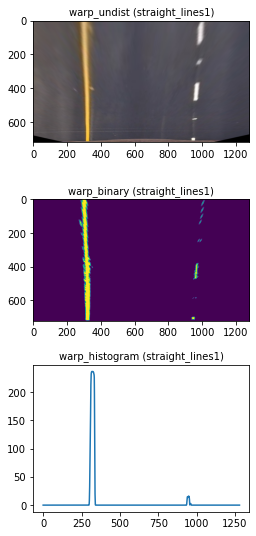

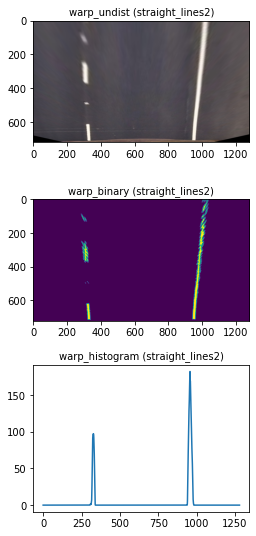

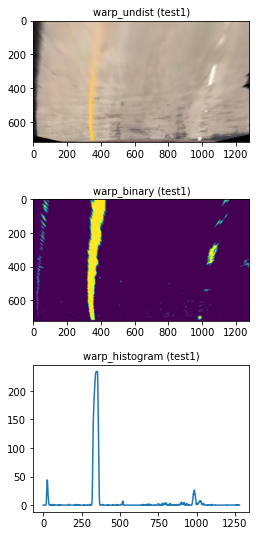

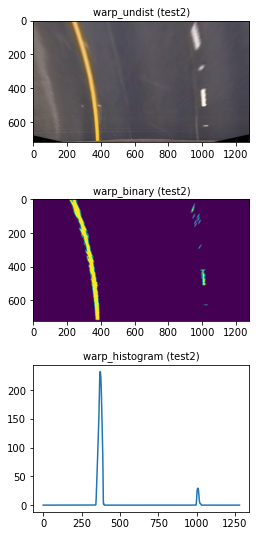

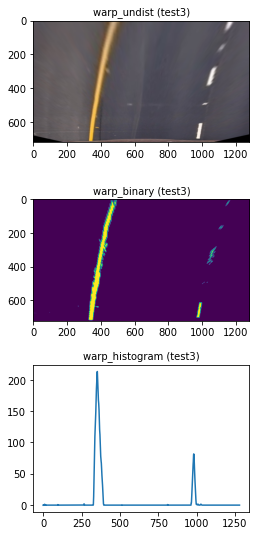

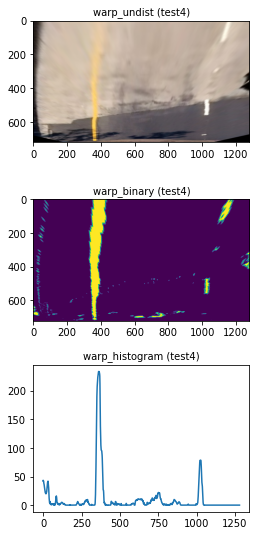

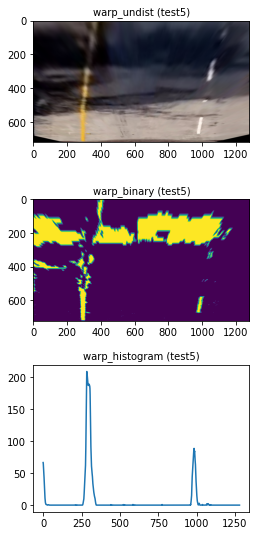

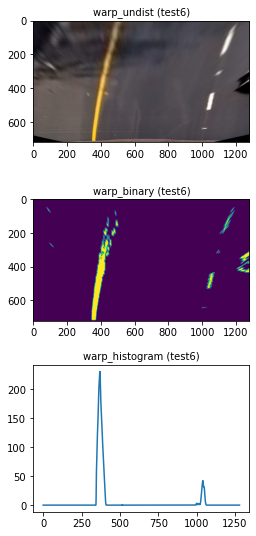

In [9]:

for fname in images:
    # 0. slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]

    img = mpimg.imread(fname)
    
    # 1. calibration image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
    # 2. make binary image using grad or color tranform ...
    gradx_binary = abs_sobelx_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady_binary = abs_sobely_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(60, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(30, 180))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.8, 1.2))
    gray_binary = gray_threshold(undistorted, sobel_kernel=ksize, thresh=(150, 220))
    hls_binary = hls_select(undistorted, thresh=(110, 255))
    
    combined_binary1 = np.zeros_like(dir_binary)
    binary_condi1 = ((gradx_binary == 1) | (grady_binary== 1)) | (mag_binary == 1)
    combined_binary1[binary_condi1] = 1
    
    combined_binary2 = np.zeros_like(dir_binary)
    binary_condi2 = (gray_binary == 1) & (dir_binary == 1)
    combined_binary2[binary_condi2] = 1
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[binary_condi1 & binary_condi2 | (hls_binary == 1)] = 1
    
    
    # 3. make top-down (birds-eye) view 
    img_size = (undistorted.shape[1], undistorted.shape[0])
#     print(f'img_size : {img_size}')
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
#     print(f'src : {src}')
#     print(f'dst : {dst}')
    warp_undist, M_undist  = warp_image(undistorted, src, dst)
    warp_binary, M_binary  = warp_image(combined_binary, src, dst)
    
    # 4. create histogram using binary image
    warp_histogram = hist(warp_binary)
    
    f, ((ax1), (ax2), (ax3)) = plt.subplots(nrows = 3, ncols = 1, figsize=(10, 10))
    
    ax1.imshow(warp_undist)
    ax1.set_title('warp_undist '+'('+ img_name +')', fontsize=10)
    ax2.imshow(warp_binary)
    ax2.set_title('warp_binary '+'('+ img_name +')', fontsize=10)
    ax3.plot(warp_histogram)
    ax3.set_title('warp_histogram '+'('+ img_name +')', fontsize=10)
    
    f.tight_layout()
    f.subplots_adjust(left=0.35, right=0.65, top=0.9, bottom=0.2)
    f.savefig('output_step3/'+ img_name + '_step3_warp & hist.jpg')

### Step4 : Line fitting test image

In [10]:
def search_around_poly(img_shape, binary_warped, margin, left_fit_init, right_fit_init,leftx,lefty,rightx,righty,stack_size):
    # Grab activated pixels

    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    nonzeroy = img_shape[0]-1-nonzeroy
    
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
    
    left_fit_init = np.array(left_fit_init)
    right_fit_init = np.array(right_fit_init)
    
    
    
    
    temp_img = np.dstack((np.zeros_like(binary_warped), np.zeros_like(binary_warped), np.zeros_like(binary_warped)))*255
    
    # stacked pixel on image [t-1] 
    temp_img[img_shape[0]-1-lefty.astype(np.int16), leftx.astype(np.int16)] = [255, 255, 0]
    temp_img[img_shape[0]-1-righty.astype(np.int16), rightx.astype(np.int16)] = [0, 255, 255]
    
    # extrated pixel on image [t] 
    temp_img[img_shape[0]-1-nonzeroy.astype(np.int16), nonzerox.astype(np.int16)] = [255, 255, 255]
    
    # reference line based on previous lane parameter [t-1]
    left_line_ref = left_fit_init[0]*nonzeroy**2 + left_fit_init[1]*nonzeroy + left_fit_init[2]
    right_line_ref = right_fit_init[0]*nonzeroy**2 + right_fit_init[1]*nonzeroy + right_fit_init[2]
    
    # select pixel index in reference boundary
    left_lane_inds = ((nonzerox >  left_line_ref - margin) & (nonzerox < left_line_ref + margin))
    right_lane_inds = ((nonzerox > right_line_ref - margin) & (nonzerox < right_line_ref + margin))

    # Again, extract left and right line pixel positions
    leftx_temp = nonzerox[left_lane_inds]
    lefty_temp = nonzeroy[left_lane_inds]
    rightx_temp = nonzerox[right_lane_inds]
    righty_temp = nonzeroy[right_lane_inds]
    
    # reference line based on previous lane parameter [t-1]
    left_line_ref = left_fit_init[0]*lefty_temp**2 + left_fit_init[1]*lefty_temp + left_fit_init[2]
    right_line_ref = right_fit_init[0]*righty_temp**2 + right_fit_init[1]*righty_temp + right_fit_init[2]
    
    # calculate absolute difference value between pixel x position and reference x position
    left_line_diff = np.abs(leftx_temp - left_line_ref)
    right_line_diff = np.abs(rightx_temp - right_line_ref)
#     print(f'left_line_diff : {left_line_diff}')
#     print(f'right_line_diff : {right_line_diff}')
    
    # calculate drop threshold
    left_line_threshold = np.percentile(left_line_diff, 80, interpolation='linear')
    right_line_threshold = np.percentile(right_line_diff, 80, interpolation='linear')
#     print(f'left_line_threshold : {left_line_threshold}')
#     print(f'right_line_threshold : {right_line_threshold}')
    
    # extract index to drop pixels
    left_line_outlier_index = np.where(left_line_diff > left_line_threshold)
    right_line_outlier_index = np.where(right_line_diff > right_line_threshold)
#     print(f'left_line_outlier_index : {left_line_outlier_index}')
#     print(f'right_line_outlier_index : {right_line_outlier_index}')
    
    # delete index to drop pixels
    leftx_temp = np.delete(leftx_temp, left_line_outlier_index)
    lefty_temp = np.delete(lefty_temp, left_line_outlier_index)    
    rightx_temp = np.delete(rightx_temp, right_line_outlier_index)
    righty_temp = np.delete(righty_temp, right_line_outlier_index)


    # extracted pixel image [t] based on previou lane parameter [t-1]
    temp_img[img_shape[0]-1-lefty_temp.astype(np.int16), leftx_temp.astype(np.int16)] = [255, 0, 0]
    temp_img[img_shape[0]-1-righty_temp.astype(np.int16), rightx_temp.astype(np.int16)] = [0, 0, 255]
        
        
#     # draw pixel image before poly fitting
#     f5, ((ax1, ax2)) = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 14))
#     ax1.imshow(temp_img)
#     ax1.set_title('temp_img_init', fontsize=20)
    
    # augment previous pixel
    leftx_temp = np.concatenate((leftx, leftx_temp), axis = None)
    lefty_temp = np.concatenate((lefty, lefty_temp), axis = None)
    rightx_temp = np.concatenate((rightx, rightx_temp), axis = None)
    righty_temp = np.concatenate((righty, righty_temp), axis = None)
        


    # after poly fitting base image
    temp_img = np.dstack((np.zeros_like(binary_warped), np.zeros_like(binary_warped), np.zeros_like(binary_warped)))*255
    temp_img[img_shape[0]-1-lefty_temp.astype(np.int16), leftx_temp.astype(np.int16)] = [255, 255, 255]
    temp_img[img_shape[0]-1-righty_temp.astype(np.int16), rightx_temp.astype(np.int16)] = [255, 255, 255]
    

    # poly fitting using extracted pixel
    left_fit_temp = np.polyfit(lefty_temp,leftx_temp,2)
    right_fit_temp = np.polyfit(righty_temp,rightx_temp,2)
#     print(f'left_fit_temp : {left_fit_temp}')
#     print(f'right_fit_temp : {right_fit_temp}')
   

    left_fit_0_stack.append(left_fit_temp[0])
    left_fit_1_stack.append(left_fit_temp[1])
    right_fit_0_stack.append(right_fit_temp[0])
    right_fit_1_stack.append(right_fit_temp[1])
    
#     print(f'left_fit_0_stack : {left_fit_0_stack}')
#     print(f'left_fit_1_stack : {left_fit_1_stack}')
#     print(f'right_fit_0_stack : {right_fit_0_stack}')
#     print(f'right_fit_1_stack : {right_fit_1_stack}')
    
    
    # stack fitted coefficient (2nd, 1st order)
    if len(left_fit_0_stack) > stack_size:
        left_fit_0_stack.pop(0)
        left_fit_1_stack.pop(0)
        right_fit_0_stack.pop(0)
        right_fit_1_stack.pop(0)
    
    # get average value for smooth
    left_fit_temp[0] = sum(left_fit_0_stack)/len(left_fit_0_stack)
    left_fit_temp[1] = sum(left_fit_1_stack)/len(left_fit_1_stack)
    right_fit_temp[0] = sum(right_fit_0_stack)/len(right_fit_0_stack)
    right_fit_temp[1] = sum(right_fit_1_stack)/len(right_fit_1_stack)
    
#     print(f'left_fit_temp : {left_fit_temp}')
#     print(f'right_fit_temp : {right_fit_temp}')
    
    
    # extract pixels for next time augment
    left_line_ref = left_fit_temp[0]*lefty_temp**2 + left_fit_temp[1]*lefty_temp + left_fit_temp[2]
    right_line_ref = right_fit_temp[0]*righty_temp**2 + right_fit_temp[1]*righty_temp + right_fit_temp[2]

    
    left_line_diff = np.abs(leftx_temp - left_line_ref)
    right_line_diff = np.abs(rightx_temp - right_line_ref)

    left_line_threshold = np.percentile(left_line_diff, 80, interpolation='linear')
    right_line_threshold = np.percentile(right_line_diff, 80, interpolation='linear')
    
    left_line_outlier_index = np.where(left_line_diff > left_line_threshold)
    right_line_outlier_index = np.where(right_line_diff > right_line_threshold)
    
    leftx_temp = np.delete(leftx_temp, left_line_outlier_index)
    lefty_temp = np.delete(lefty_temp, left_line_outlier_index)
    
    rightx_temp = np.delete(rightx_temp, right_line_outlier_index)
    righty_temp = np.delete(righty_temp, right_line_outlier_index)
    
    len_thres = 200000
    if len(leftx_temp) > len_thres:
        leftx_temp = leftx_temp[-len_thres:]
        lefty_temp = lefty_temp[-len_thres:]
    if len(rightx_temp) > len_thres:
        rightx_temp = rightx_temp[-len_thres:]
        righty_temp = righty_temp[-len_thres:]
    
    # extracted pixel image [t] to use augment image [t+1] (if needed)
    temp_img[img_shape[0]-1-lefty_temp.astype(np.int16), leftx_temp.astype(np.int16)] = [255, 0, 0]
    temp_img[img_shape[0]-1-righty_temp.astype(np.int16), rightx_temp.astype(np.int16)] = [0, 0, 255]
    
    
    
    ploty = np.linspace(0, img_shape[0]-1, img_shape[0])
#     print(f'ploty : {ploty}')

    left_fitx = left_fit_temp[2] + left_fit_temp[1]*ploty + left_fit_temp[0]*ploty**2
    right_fitx = right_fit_temp[2] + right_fit_temp[1]*ploty + right_fit_temp[0]*ploty**2
    
    left_fitx_outlier_index = np.where((left_fitx < 0)|(left_fitx > 1280))
    right_fitx_outlier_index = np.where((right_fitx < 0)|(right_fitx > 1280))
    
#     print(f'left_fitx_outlier_index : {left_fitx_outlier_index}')
#     print(f'right_fitx_outlier_index : {right_fitx_outlier_index}')
    
    left_fitx_temp = np.delete(left_fitx, left_fitx_outlier_index)
    ploty_left_temp = np.delete(ploty, left_fitx_outlier_index)
    right_fitx_temp = np.delete(right_fitx, right_fitx_outlier_index)
    ploty_right_temp = np.delete(ploty, right_fitx_outlier_index)
    
    
    temp_img[img_shape[0]-1-ploty_left_temp.astype(np.int16), left_fitx_temp.astype(np.int16)] = [255, 255,255]
    temp_img[img_shape[0]-1-ploty_right_temp.astype(np.int16), right_fitx_temp.astype(np.int16)] = [255, 255,255]
    
#     ax2.imshow(temp_img)
#     ax2.set_title('temp_img_after', fontsize=20)
    
    
    return left_fit_temp, right_fit_temp,leftx_temp,lefty_temp,rightx_temp,righty_temp, left_fitx_temp, right_fitx_temp, ploty_left_temp, ploty_right_temp

def measure_curvature_real(left_fitx, right_fitx, ploty_left, ploty_right, xm_per_pix, ym_per_pix):
    left_fitx = left_fitx
    right_fitx = right_fitx
    left_fit_cr = np.polyfit(ploty_left*ym_per_pix, left_fitx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(ploty_right*ym_per_pix, right_fitx*xm_per_pix, 2)
    
#     print(f'left_fit_cr : {left_fit_cr}')
#     print(f'right_fit_cr : {right_fit_cr}')
    
    # Calculation of R_curve (radius of curvature)
    
    left_curverad = ((1 + (left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    
    if left_fit_cr[0] > 0:
        left_curverad = left_curverad
    else:
        left_curverad = -left_curverad
        
    if right_fit_cr[0] > 0:
        right_curverad = right_curverad
    else:
        right_curverad = -right_curverad
    
    left_head  = left_fit_cr[1]
    right_head  = right_fit_cr[1]
    
    left_offset  = left_fit_cr[2]
    right_offset  = right_fit_cr[2]
    
    return left_curverad, right_curverad, left_head, right_head,left_offset,right_offset

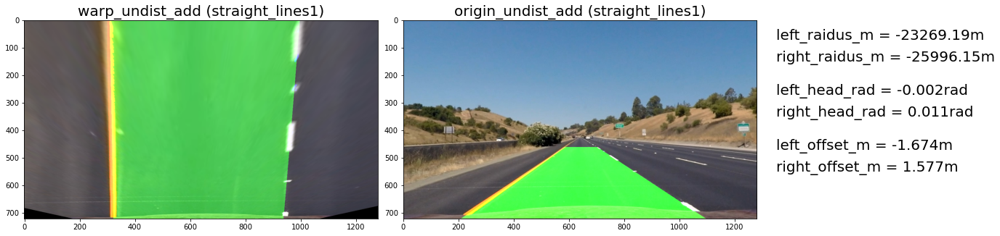

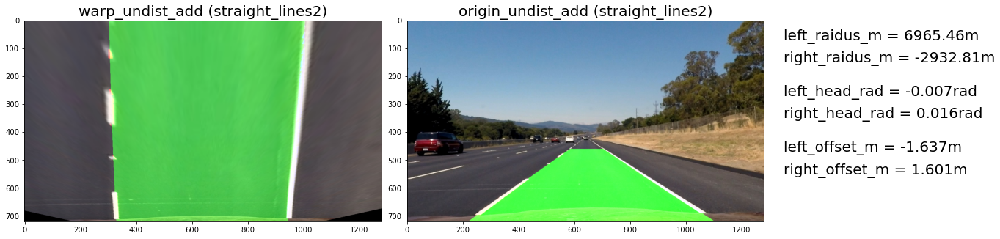

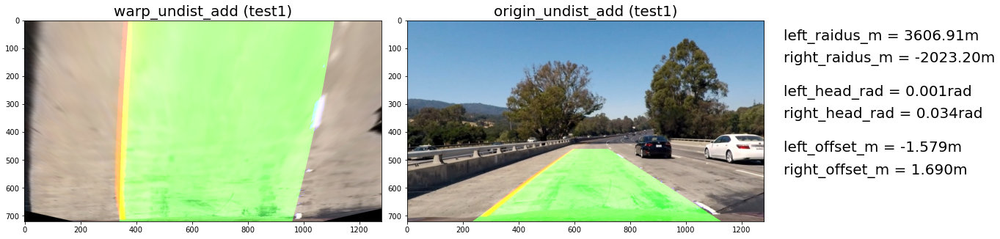

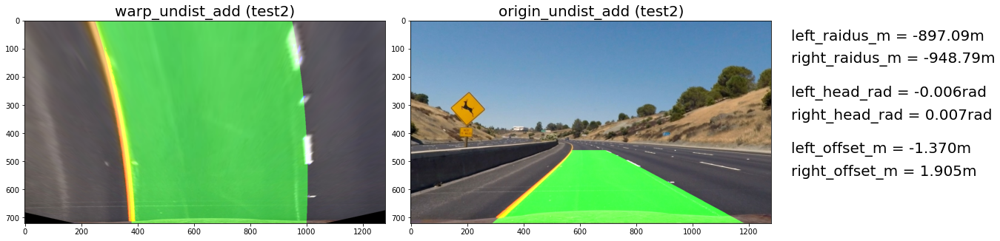

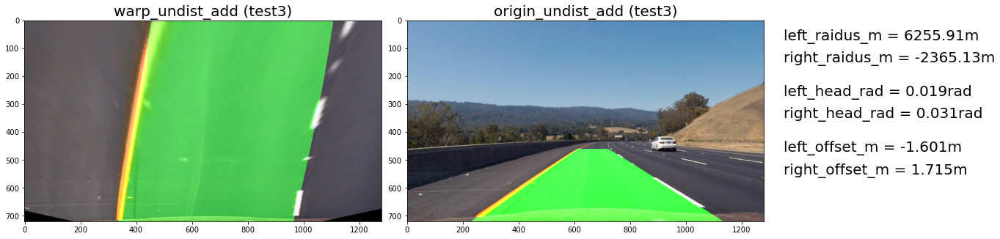

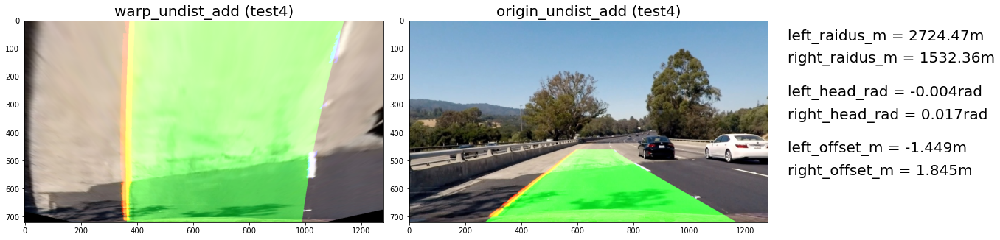

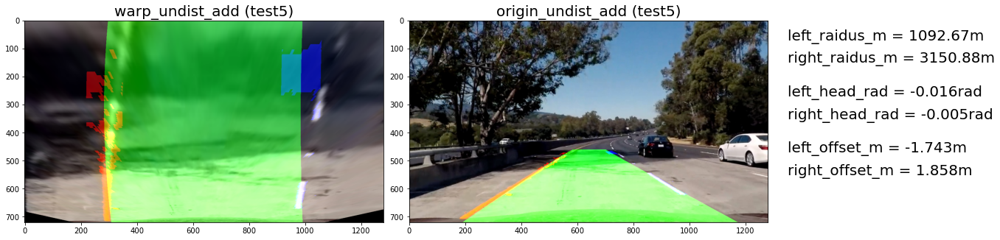

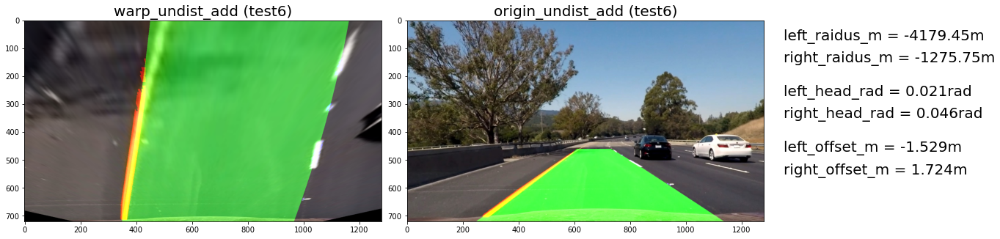

In [11]:

for fname in images:
    
    
    left_fit_init = [0,0,0]
    right_fit_init = [0,0,0]

    left_fit = [0,0,0]
    right_fit = [0,0,0]

    leftx = np.empty((1,))
    lefty = np.empty((1,))
    rightx = np.empty((1,))
    righty = np.empty((1,))

    left_fit_0_stack = []
    left_fit_1_stack = []
    right_fit_0_stack = []
    right_fit_1_stack = []

    left_init_offset_temp = 400
    right_init_offset_temp = 900


    # 0. slicing image name
    img_name = fname.split('.')
    img_name = img_name[0].split('\\')
    img_name = img_name[1]

    img = mpimg.imread(fname)
    
    # 1. calibration image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
   # 2. make binary image using grad or color tranform ...
    gradx_binary = abs_sobelx_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady_binary = abs_sobely_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(60, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(30, 180))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.8, 1.2))
    gray_binary = gray_threshold(undistorted, sobel_kernel=ksize, thresh=(150, 200))
    hls_binary = hls_select(undistorted, thresh=(120, 235))
    
    combined_binary1 = np.zeros_like(dir_binary)
    binary_condi1 = ((gradx_binary == 1) | (grady_binary== 1)) | (mag_binary == 1)
    combined_binary1[binary_condi1] = 1
    
    combined_binary2 = np.zeros_like(dir_binary)
    binary_condi2 = (gray_binary == 1) & (dir_binary == 1)
    combined_binary2[binary_condi2] = 1
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[binary_condi1 & binary_condi2 | (hls_binary == 1)] = 1
    
    
    # 3. make top-down (birds-eye) view 
    img_size = (undistorted.shape[1], undistorted.shape[0])
#     print(f'img_size : {img_size}')
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
#     print(f'src : {src}')
#     print(f'dst : {dst}')
    warp_undist, M_undist  = warp_image(undistorted, src, dst)
    warp_binary, M_binary  = warp_image(combined_binary, src, dst)
    
    # 4. create histogram using binary image
    warp_histogram = hist(warp_binary)

    
    # 5. finding polynomial fitting component of the lane
    margin = 120
    warp_hist_left_bound = warp_histogram[img_size[0]//2 - 400 : img_size[0]//2 - 100]
    warp_hist_right_bound = warp_histogram[img_size[0]//2 + 100 : img_size[0]//2 + 400]
    
    if np.max(warp_hist_left_bound) < 5:
        left_init_offset = left_init_offset_temp
    else:
        left_init_offset = np.argmax(warp_hist_left_bound)
        left_init_offset_temp = left_init_offset
        
    if np.max(warp_hist_right_bound) < 5:
        right_init_offset = right_init_offset_temp
    else:
        right_init_offset = np.argmax(warp_hist_right_bound)
        right_init_offset_temp = right_init_offset
        
    
    
    
    left_line_index = img_size[0]//2 - 400 + left_init_offset
    right_line_index = img_size[0]//2 + 100 + right_init_offset
#     print(f'left_line_index : {left_line_index}')
#     print(f'right_line_index : {right_line_index}')
    
   
    
    if not len(left_fit):
        left_fit_init = [0, 0, left_line_index]
    else:
        left_fit_init[0] = left_fit[0]
        left_fit_init[1] = left_fit[1]
        left_fit_init[2] = left_line_index
    
    if not len(right_fit):
        right_fit_init = [0, 0, right_line_index]
    else:
        right_fit_init[0] = right_fit[0]
        right_fit_init[1] = right_fit[1]
        right_fit_init[2] = right_line_index
        
#     print(f'left_fit_init : {left_fit_init}')
#     print(f'right_fit_init : {right_fit_init}')

    stack_size = 1


    left_fit, right_fit, leftx, lefty, rightx, righty, left_fitx, right_fitx, ploty_left, ploty_right = search_around_poly(warp_binary.shape, warp_binary, margin, left_fit_init, right_fit_init,leftx,lefty,rightx,righty,stack_size)
    
#     print(f'left_fit : {left_fit}')
#     print(f'right_fit : {right_fit}')
    

        
        
#     print(f'left_fit_avg : {left_fit}')
#     print(f'right_fit_avg : {right_fit}')
    
    


   
    # 7. Fit new polynomials based on real world
    # left (-x), right(+x), forward (+y), backward (-y)
    # x = offset_m + head_rad*y + 1/(2*radius_m)**y (if head is small assumption)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_fitx_real = left_fitx - img_size[0]//2
    right_fitx_real = right_fitx - img_size[0]//2
    left_raidus_m, right_raidus_m, left_head_rad, right_head_rad, left_offset_m, right_offset_m = measure_curvature_real(left_fitx_real, right_fitx_real, ploty_left, ploty_right, xm_per_pix, ym_per_pix)
#     print(f'left_raidus_m = {left_raidus_m}')
#     print(f'right_raidus_m = {right_raidus_m}')
#     print(f'left_head_rad = {left_head_rad}')
#     print(f'right_head_rad = {right_head_rad}')
#     print(f'left_offset_m = {left_offset_m}')
#     print(f'right_offset_m = {right_offset_m}')



    #8. Add line polynomials on the original imag
    out_img = np.dstack((np.zeros_like(warp_binary), np.zeros_like(warp_binary), np.zeros_like(warp_binary)))*255
    out_img[img_size[1]-1-lefty.astype(np.int16), leftx.astype(np.int16)] = [255, 0, 0]
    out_img[img_size[1]-1-righty.astype(np.int16), rightx.astype(np.int16)] = [0, 0, 255]
    
    mask = np.zeros_like(out_img)
    left_area = np.vstack((left_fitx.astype(np.int32),img_size[1]-1-ploty_left.astype(np.int32))).T
    right_area = np.vstack((right_fitx.astype(np.int32),img_size[1]-1-ploty_right.astype(np.int32))).T
    area_point = np.vstack((left_area,right_area[::-1]))
    area = cv2.fillPoly(mask,[area_point],[0, 255, 0])
    warp_binary_add = cv2.addWeighted(area, 1, out_img, 1, 0)
    warp_undist_add = cv2.addWeighted(warp_binary_add.astype(np.uint8), 0.5, warp_undist, 1, 0)
    
    origin_binary_add, M_binary  = warp_image(warp_binary_add, dst, src)
    origin_undist_add = cv2.addWeighted(origin_binary_add.astype(np.uint8), 0.8, undistorted, 1, 0)

    

    
    
    f, ((ax1, ax2)) = plt.subplots(nrows = 1, ncols = 2, figsize=(20, 14))
    ax1.imshow(warp_undist_add)
    ax1.set_title('warp_undist_add '+'('+ img_name +')', fontsize=20)
    ax2.imshow(origin_undist_add)   
    ax2.set_title('origin_undist_add '+'('+ img_name +')', fontsize=20)
    ax2.text(1350,70,f'left_raidus_m = {left_raidus_m:0.2f}m', fontsize=20)
    ax2.text(1350,150,f'right_raidus_m = {right_raidus_m:0.2f}m', fontsize=20)
    ax2.text(1350,270,f'left_head_rad = {left_head_rad:0.3f}rad', fontsize=20)
    ax2.text(1350,350,f'right_head_rad = {right_head_rad:0.3f}rad', fontsize=20)
    ax2.text(1350,470,f'left_offset_m = {left_offset_m:0.3f}m', fontsize=20)
    ax2.text(1350,550,f'right_offset_m = {right_offset_m:0.3f}m', fontsize=20)
    f.tight_layout()
    f.subplots_adjust(left=0.05, right=0.75, top=0.9, bottom=0.2)
    f.savefig('output_step4/'+ img_name + '_step4_linefit.jpg')
    

## 3. Pipeline using test videos

In [12]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [13]:
def process_image(img):   
    global left_fit_init, right_fit_init, left_fit, right_fit, leftx, lefty, rightx, righty, left_fit_0_stack, left_fit_1_stack, right_fit_0_stack, right_fit_0_stack, right_fit_1_stack, left_init_offset_temp, right_init_offset_temp
    
    
    # 1. calibration image
    undistorted = cv2.undistort(img, mtx, dist, None, mtx)
    
   # 2. make binary image using grad or color tranform ...
    gradx_binary = abs_sobelx_thresh(undistorted, orient='x', sobel_kernel=ksize, thresh=(20, 100))
    grady_binary = abs_sobely_thresh(undistorted, orient='y', sobel_kernel=ksize, thresh=(60, 100))
    mag_binary = mag_thresh(undistorted, sobel_kernel=ksize, mag_thresh=(30, 180))
    dir_binary = dir_threshold(undistorted, sobel_kernel=ksize, thresh=(0.8, 1.2))
    gray_binary = gray_threshold(undistorted, sobel_kernel=ksize, thresh=(150, 200))
    hls_binary = hls_select(undistorted, thresh=(110, 235))
    
    combined_binary1 = np.zeros_like(dir_binary)
    binary_condi1 = ((gradx_binary == 1) | (grady_binary== 1)) | (mag_binary == 1)
    combined_binary1[binary_condi1] = 1
    
    combined_binary2 = np.zeros_like(dir_binary)
    binary_condi2 = (gray_binary == 1) & (dir_binary == 1)
    combined_binary2[binary_condi2] = 1
    
    combined_binary = np.zeros_like(dir_binary)
    combined_binary[binary_condi1 & binary_condi2 | (hls_binary == 1)] = 1
    
#     f, ((ax1, ax2),(ax3, ax4)) = plt.subplots(nrows = 2, ncols = 2, figsize=(15, 14))

#     ax1.imshow(combined_binary1)
#     ax1.set_title('combined_binary1 '+'('+ img_name +')', fontsize=10)
#     ax2.imshow(combined_binary2)
#     ax2.set_title('combined_binary2 '+'('+ img_name +')', fontsize=10)
#     ax3.imshow(hls_binary)
#     ax3.set_title('hls_binary '+'('+ img_name +')', fontsize=10)
#     ax4.imshow(combined_binary)
#     ax4.set_title('combined_binary '+'('+ img_name +')', fontsize=10)
#     f.tight_layout()
#     f.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.2)
    
    
    # 3. make top-down (birds-eye) view 
    img_size = (undistorted.shape[1], undistorted.shape[0])
#     print(f'img_size : {img_size}')
    src = np.float32(
        [[(img_size[0] / 2) - 55, img_size[1] / 2 + 100],
        [((img_size[0] / 6) - 10), img_size[1]],
        [(img_size[0] * 5 / 6) + 60, img_size[1]],
        [(img_size[0] / 2 + 55), img_size[1] / 2 + 100]])
    dst = np.float32(
        [[(img_size[0] / 4), 0],
        [(img_size[0] / 4), img_size[1]],
        [(img_size[0] * 3 / 4), img_size[1]],
        [(img_size[0] * 3 / 4), 0]])
    
#     print(f'src : {src}')
#     print(f'dst : {dst}')
    warp_undist, M_undist  = warp_image(undistorted, src, dst)
    warp_binary, M_binary  = warp_image(combined_binary, src, dst)
    
    # 4. create histogram using binary image
    warp_histogram = hist(warp_binary)

    
    # 5. finding polynomial fitting component of the lane
    margin = 100
    warp_hist_left_bound = warp_histogram[img_size[0]//2 - 400 : img_size[0]//2 - 100]
    warp_hist_right_bound = warp_histogram[img_size[0]//2 + 100 : img_size[0]//2 + 400]
    
    if np.max(warp_hist_left_bound) < 5:
        left_init_offset = left_init_offset_temp
    else:
        left_init_offset = np.argmax(warp_hist_left_bound)
        left_init_offset_temp = left_init_offset
        
    if np.max(warp_hist_right_bound) < 5:
        right_init_offset = right_init_offset_temp
    else:
        right_init_offset = np.argmax(warp_hist_right_bound)
        right_init_offset_temp = right_init_offset
        
    
    
    
    left_line_index = img_size[0]//2 - 400 + left_init_offset
    right_line_index = img_size[0]//2 + 100 + right_init_offset
#     print(f'left_line_index : {left_line_index}')
#     print(f'right_line_index : {right_line_index}')
    
   
    
    if not len(left_fit):
        left_fit_init = [0, 0, left_line_index]
    else:
        left_fit_init[0] = left_fit[0]
        left_fit_init[1] = left_fit[1]
        left_fit_init[2] = left_line_index
    
    if not len(right_fit):
        right_fit_init = [0, 0, right_line_index]
    else:
        right_fit_init[0] = right_fit[0]
        right_fit_init[1] = right_fit[1]
        right_fit_init[2] = right_line_index
        
#     print(f'left_fit_init : {left_fit_init}')
#     print(f'right_fit_init : {right_fit_init}')

    stack_size = 5
    left_fit, right_fit, leftx, lefty, rightx, righty, left_fitx, right_fitx, ploty_left, ploty_right = search_around_poly(warp_binary.shape, warp_binary, margin, left_fit_init, right_fit_init,leftx,lefty,rightx,righty,stack_size)
    
#     print(f'left_fit : {left_fit}')
#     print(f'right_fit : {right_fit}')

        
        
#     print(f'left_fit_avg : {left_fit}')
#     print(f'right_fit_avg : {right_fit}')
    
    


   
    # 7. Fit new polynomials based on real world
    # left (-x), right(+x), forward (+y), backward (-y)
    # x = offset_m + head_rad*y + 1/(2*radius_m)**y (if head is small assumption)
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    left_fitx_real = left_fitx - img_size[0]//2
    right_fitx_real = right_fitx - img_size[0]//2
    left_raidus_m, right_raidus_m, left_head_rad, right_head_rad, left_offset_m, right_offset_m = measure_curvature_real(left_fitx_real, right_fitx_real, ploty_left, ploty_right, xm_per_pix, ym_per_pix)
#     print(f'left_raidus_m = {left_raidus_m}')
#     print(f'right_raidus_m = {right_raidus_m}')
#     print(f'left_head_rad = {left_head_rad}')
#     print(f'right_head_rad = {right_head_rad}')
#     print(f'left_offset_m = {left_offset_m}')
#     print(f'right_offset_m = {right_offset_m}')



    #8. Add line polynomials on the original imag
    out_img = np.dstack((np.zeros_like(warp_binary), np.zeros_like(warp_binary), np.zeros_like(warp_binary)))*255
    out_img[img_size[1]-1-lefty.astype(np.int16), leftx.astype(np.int16)] = [255, 0, 0]
    out_img[img_size[1]-1-righty.astype(np.int16), rightx.astype(np.int16)] = [0, 0, 255]
    
    mask = np.zeros_like(out_img)
    left_area = np.vstack((left_fitx.astype(np.int32),img_size[1]-1-ploty_left.astype(np.int32))).T
    right_area = np.vstack((right_fitx.astype(np.int32),img_size[1]-1-ploty_right.astype(np.int32))).T
    area_point = np.vstack((left_area,right_area[::-1]))
    area = cv2.fillPoly(mask,[area_point],[0, 255, 0])
    warp_binary_add = cv2.addWeighted(area, 1, out_img, 1, 0)
    warp_undist_add = cv2.addWeighted(warp_binary_add.astype(np.uint8), 0.5, warp_undist, 1, 0)
    
    origin_binary_add, M_binary  = warp_image(warp_binary_add, dst, src)
    origin_undist_add = cv2.addWeighted(origin_binary_add.astype(np.uint8), 0.8, undistorted, 1, 0)

    
    
    

    text1 = (f'left_raidus_m = {left_raidus_m:0.2f}m')
    text2 = (f'right_raidus_m = {right_raidus_m:0.2f}m')
    text3 = (f'left_head_rad = {left_head_rad:0.3f}rad')
    text4 = (f'right_head_rad = {right_head_rad:0.3f}rad')
    text5 = (f'left_offset_m = {left_offset_m:0.3f}m')
    text6 = (f'right_offset_m = {right_offset_m:0.3f}m')
    
    cv2.putText(origin_undist_add, text1, (30,50), 0, 1, (255,255,255), 2)
    cv2.putText(origin_undist_add, text2, (30,80), 0, 1, (255,255,255), 2)
    cv2.putText(origin_undist_add, text3, (30,130), 0, 1, (255,255,255), 2)
    cv2.putText(origin_undist_add, text4, (30,160), 0, 1, (255,255,255), 2)
    cv2.putText(origin_undist_add, text5, (30,210), 0, 1, (255,255,255), 2)
    cv2.putText(origin_undist_add, text6, (30,240), 0, 1, (255,255,255), 2)
    
    result = origin_undist_add
    

    
    return result 

In [14]:
project_video_out = 'project_video_out.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

global left_fit_0_stack, left_fit_1_stack, right_fit_0_stack, right_fit_1_stack, left_fit_init, right_fit_init, left_fit, right_fit, leftx, lefty, rightx, righty, left_fit_0_stack, left_fit_1_stack, right_fit_0_stack, right_fit_0_stack, right_fit_1_stack, left_init_offset_temp, right_init_offset_temp

left_fit_init = [0,0,0]
right_fit_init = [0,0,0]

left_fit = [0,0,0]
right_fit = [0,0,0]

leftx = np.empty((1,))
lefty = np.empty((1,))
rightx = np.empty((1,))
righty = np.empty((1,))

left_fit_0_stack = []
left_fit_1_stack = []
right_fit_0_stack = []
right_fit_1_stack = []

left_init_offset_temp = 400
right_init_offset_temp = 900


clip1 = VideoFileClip("project_video.mp4")
project_videoe_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
project_videoe_clip.write_videofile(project_video_out, audio=False)

t:   0%|          | 0/1260 [00:00<?, ?it/s, now=None]

Moviepy - Building video project_video_out.mp4.
Moviepy - Writing video project_video_out.mp4



Moviepy - Done !
Moviepy - video ready project_video_out.mp4


In [15]:
HTML("""
<video width="500" height="300" controls>
  <source src="{0}">
</video>
""".format(project_video_out))

In [16]:
challenge_video_out = 'challenge_video_out.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

global left_fit_0_stack, left_fit_1_stack, right_fit_0_stack, right_fit_1_stack, left_fit_init, right_fit_init, left_fit, right_fit, leftx, lefty, rightx, righty, left_fit_0_stack, left_fit_1_stack, right_fit_0_stack, right_fit_0_stack, right_fit_1_stack, left_init_offset_temp, right_init_offset_temp

left_fit_init = [0,0,0]
right_fit_init = [0,0,0]

left_fit = [0,0,0]
right_fit = [0,0,0]

leftx = np.empty((1,))
lefty = np.empty((1,))
rightx = np.empty((1,))
righty = np.empty((1,))

left_fit_0_stack = []
left_fit_1_stack = []
right_fit_0_stack = []
right_fit_1_stack = []

left_init_offset_temp = 400
right_init_offset_temp = 900

clip1 = VideoFileClip("challenge_video.mp4")
challenge_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time challenge_video_clip.write_videofile(challenge_video_out, audio=False)

t:   0%|          | 0/485 [00:00<?, ?it/s, now=None]

Moviepy - Building video challenge_video_out.mp4.
Moviepy - Writing video challenge_video_out.mp4



Moviepy - Done !
Moviepy - video ready challenge_video_out.mp4
Wall time: 1min 34s


In [17]:
HTML("""
<video width="500" height="300" controls>
  <source src="{0}">
</video>
""".format(challenge_video_out))

In [18]:
harder_challenge_video_out = 'harder_challenge_video_out.mp4'
## To speed up the testing process you may want to try your pipeline on a shorter subclip of the video
## To do so add .subclip(start_second,end_second) to the end of the line below
## Where start_second and end_second are integer values representing the start and end of the subclip
## You may also uncomment the following line for a subclip of the first 5 seconds
##clip1 = VideoFileClip("test_videos/solidWhiteRight.mp4").subclip(0,5)

global left_fit_0_stack, left_fit_1_stack, right_fit_0_stack, right_fit_1_stack, left_fit_init, right_fit_init, left_fit, right_fit, leftx, lefty, rightx, righty, left_fit_0_stack, left_fit_1_stack, right_fit_0_stack, right_fit_0_stack, right_fit_1_stack, left_init_offset_temp, right_init_offset_temp

left_fit_init = [0,0,0]
right_fit_init = [0,0,0]

left_fit = [0,0,0]
right_fit = [0,0,0]

leftx = np.empty((1,))
lefty = np.empty((1,))
rightx = np.empty((1,))
righty = np.empty((1,))

left_fit_0_stack = []
left_fit_1_stack = []
right_fit_0_stack = []
right_fit_1_stack = []

left_init_offset_temp = 400
right_init_offset_temp = 900

clip1 = VideoFileClip("harder_challenge_video.mp4")
harder_challenge_video_clip = clip1.fl_image(process_image) #NOTE: this function expects color images!!
%time harder_challenge_video_clip.write_videofile(harder_challenge_video_out, audio=False)

t:   0%|          | 0/1199 [00:00<?, ?it/s, now=None]

Moviepy - Building video harder_challenge_video_out.mp4.
Moviepy - Writing video harder_challenge_video_out.mp4



t:  17%|█▋        | 198/1199 [00:43<03:18,  5.04it/s, now=None]

IndexError: cannot do a non-empty take from an empty axes.

In [19]:
HTML("""
<video width="500" height="300" controls>
  <source src="{0}">
</video>
""".format(harder_challenge_video_out))